In [2]:
import matplotlib.pyplot as plt
import os
from pathlib import Path
import random
from skimage.io import imread
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils

## Dataset and Data Loader

In [3]:
bs = 64                # Batch size (paper uses 128).
img_size = 64          # Size of input (here it's 64 x 64).
workers = 2            # Number of workers for data loader.
noise_dim = 100        # Depth of input noise (1 x 1 x noise_dim). AKA nz.
ngf = 64               # Number of filters in last layer before reduced to 3.
ndf = 64               # Number of filters in first conv layer in D.
lr = 2e-4              # Recommended learning rate of .0002.
beta1 = .5             # Recommended parameter for Adam.
nc = 3                 # Number of channels of input image.
ngpu = 1               # Number of GPUs to use.
sample_dir = 'samples' # Directory to store sample images from G. 
weight_dir = 'weights' # Directory to store model weights.
device = torch.device('cuda:0' if torch.cuda.is_available() and ngpu > 0 
                      else 'cpu')

In [4]:
tfms = transforms.Compose([transforms.Resize(img_size),
                           transforms.ToTensor(),  
                           transforms.Normalize((.5, .5, .5), (.5, .5, .5))
                          ])

ds = dset.CIFAR10(root='cifar',
                       download=False, # True the first time we run code.
                       transform=tfms
                       )

dl = torch.utils.data.DataLoader(ds, batch_size=bs, shuffle=True,
                                 num_workers=workers)

In [5]:
small_ds = dset.ImageFolder('sketch_data/photo/tx_000100000000/tmp',
                            transform=tfms)
small_dl = torch.utils.data.DataLoader(small_ds, batch_size=bs, shuffle=True,
                                       num_workers=workers)

## Models

In [6]:
def weights_init(module):
    """Initialize weights from normal distribution with mean 0 and standard 
    deviation 0.02. For batch norm layers, a mean of 1.0 has had empirical
    success.
    """
    class_name = module.__class__.__name__
    if 'Conv' in class_name:
        module.weight.data.normal_(0.0, 0.02)
    elif 'BatchNorm' in class_name:
        module.weight.data.normal_(1.0, 0.02)
        module.bias.data.fill_(0)

In [7]:
class Generator(nn.Module):
    
    def __init__(self, ngpu, noise_dim, ngf, nc):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(noise_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, x):
        if x.is_cuda and self.ngpu > 1:
            output = nn.parallel.data_parallel(self.main, x, range(self.ngpu))
        else:
            output = self.main(x)
        return output
    
    def dims(self):
        """Get shape of each layer's weights."""
        return [p.shape for p in self.parameters()]
    
    def trainable(self):
        """Check which layers are trainable."""
        return [p.requires_grad for p in self.parameters()]
    
    def layer_stats(self):
        """Check mean and standard deviation of each layer's weights."""
        return [(round(p.data.mean().item(), 3), 
                 round(p.data.std().item(), 3))
                 for p in self.parameters()]

In [8]:
class Discriminator(nn.Module):
    
    def __init__(self, ngpu, ndf, nc):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        if x.is_cuda and self.ngpu > 1:
            output = nn.parallel.data_parallel(self.main, x, range(self.ngpu))
        else:
            output = self.main(x)
        return output.view(-1, 1).squeeze(1)
    
    def dims(self):
        """Get shape of each layer's weights."""
        return [p.shape for p in self.parameters()]
    
    def trainable(self):
        """Check which layers are trainable."""
        return [p.requires_grad for p in self.parameters()]
    
    def layer_stats(self):
        """Check mean and standard deviation of each layer's weights."""
        return [(round(p.data.mean().item(), 3), 
                 round(p.data.std().item(), 3))
                 for p in self.parameters()]

In [9]:
# criterion = nn.BCELoss()
# fixed_noise = torch.randn(bs, noise_dim, 1, 1, device=device)
# real_label = 1
# fake_label = 0

In [10]:
# d_optim = optim.Adam(D.parameters(), lr=lr, betas=(beta1, 0.999))
# g_optim = optim.Adam(G.parameters(), lr=lr, betas=(beta1, 0.999))

In [27]:
def train(epochs, dl, sample_dir, weight_dir, lr=2e-4, beta1=.5, ngpu=ngpu, 
          ndf=ndf, ngf=ngf, nc=nc):
    """Train discriminator and generator with Adam.
    
    Parameters
    -----------
    D: nn.Module
        Discriminator
    G: nn.Module
        Generator (binary classifier, 1 for real, 0 for fake).
    dl: DataLoader
    sample_dir: str
        Directory to save generated images.
    weight_dir: str
        Directory to save final weights.
    lr: float
        Learning rate. Paper recommends .0002.
    beta1: float
        Hyperparameter for Adam. Paper recommends 0.5.
    """
    # Create models.
    D = Discriminator(ngpu, ndf, nc).to(device)
    D.apply(weights_init)
    G = Generator(ngpu, noise_dim, ngf, nc).to(device)
    G.apply(weights_init)
    
    # Define loss and optimizers.
    criterion = nn.BCELoss()
    d_optim = optim.Adam(D.parameters(), lr=lr, betas=(beta1, .999))
    g_optim = optim.Adam(G.parameters(), lr=lr, betas=(beta1, .999))
    
    # Fixed noise not used for training, but to generate images to save at 
    # diff epochs.
    fixed_noise = torch.randn(dl.batch_size, noise_dim, 1, 1, device=device)
    real_label = 1
    fake_label = 0

    # Store stats to return at end.
    d_real_losses = []
    d_fake_losses = []
    g_losses = []
    d_real_avg = []
    d_fake_avg = []
    
    # Start training.
    for epoch in range(epochs):
        for i, (x, y) in enumerate(dl):
            x = x.to(device)
            bs_curr = x.shape[0]
            label = torch.full((bs_curr,), real_label, device=device)

            ##################################################################
            # Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ##################################################################
            # Train with real examples.
            D.zero_grad()
            output = D(x)
            d_loss_real = criterion(output, label)
            d_real_losses.append(d_loss_real)
            d_x = output.mean().item()
            d_loss_real.backward()

            # Train with fake examples from G.
            noise = torch.randn(bs_curr, noise_dim, 1, 1, device=device)
            fake = G(noise)
            label.fill_(fake_label)
    
            output = D(fake.detach())
            d_loss_fake = criterion(output, label)
            d_fake_losses.append(d_loss_fake)
            d_g_z1 = output.mean().item()
            d_loss = d_loss_real + d_loss_fake
            d_loss_fake.backward()
            d_optim.step()

            ##################################################################
            # Update G network: maximize log(D(G(z)))
            ##################################################################
            G.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            output = D(fake)
            g_loss = criterion(output, label)
            g_losses.append(g_loss)
            d_g_z2 = output.mean().item()
            g_loss.backward()
            g_optim.step()
        
            # Print stats for each mini batch.
            print(f'\nEpoch [{epoch+1}/{epochs}] \t Batch [{i+1}/{len(dl)}]\n'
                  f'Loss_D: {d_loss.item():.3f}\tLoss_G: {g_loss.item():.3f}'
                  f'\nD(x): {d_x:.3f} \t D(G(z)): {d_g_z1:.3f}, {d_g_z2:.3f}')
            
        # Generate sample images at end of every fifth epoch.
        if epoch % 10 == 0:
            with torch.no_grad():
                fake = G(fixed_noise)
                vutils.save_image(fake.detach(),
                                  f'{sample_dir}/fake_epoch_{epoch}.png',
                                  normalize=True)
        
    # Save weights at end (can move inside loop to save at each epoch).
#     states = dict(g=G.state_dict(), 
#                   d=D.state_dict(),
#                   g_optimizer=g_optim.state_dict(),
#                   d_optimizer=d_optim.state_dict(),
#                   epoch=epoch)
#     torch.save(states, f'{weight_dir}/model_e{epoch}.pth')
    
    return dict(d=D,
                g=G,
                d_real_losses=d_real_losses,
                d_fake_losses=d_fake_losses,
                g_losses=g_losses,
                d_real_avg=d_real_avg,
                d_fake_avg=d_fake_avg
                )

In [62]:
# def train(epochs, dl, sample_dir, weight_dir, lr=2e-4, beta1=.5, ngpu=ngpu, 
#           ndf=ndf, ngf=ngf, nc=nc, D=None, G=None):
#     """Train discriminator and generator with Adam.
    
#     Parameters
#     -----------
#     D: nn.Module
#         Discriminator
#     G: nn.Module
#         Generator (binary classifier, 1 for real, 0 for fake).
#     dl: DataLoader
#     sample_dir: str
#         Directory to save generated images.
#     weight_dir: str
#         Directory to save final weights.
#     lr: float
#         Learning rate. Paper recommends .0002.
#     beta1: float
#         Hyperparameter for Adam. Paper recommends 0.5.
#     """
#     # Create models.
#     if not (D or G):
#         D = Discriminator(ngpu, ndf, nc).to(device)
#         D.apply(weights_init)
#         G = Generator(ngpu, noise_dim, ngf, nc).to(device)
#         G.apply(weights_init)
    
#     # Define loss and optimizers.
#     criterion = nn.BCELoss()
#     d_optim = optim.Adam(D.parameters(), lr=lr, betas=(beta1, .999))
#     g_optim = optim.Adam(G.parameters(), lr=lr, betas=(beta1, .999))
    
#     # Fixed noise not used for training, but to generate images to save at 
#     # diff epochs.
#     fixed_noise = torch.randn(dl.batch_size, noise_dim, 1, 1, device=device)
#     real_label = 1
#     fake_label = 0

#     # Store stats to return at end.
#     d_real_losses = []
#     d_fake_losses = []
#     g_losses = []
#     d_real_avg = []
#     d_fake_avg = []
    
#     # Start training.
#     for epoch in range(epochs):
#         for i, (x, y) in enumerate(dl):
#             x = x.to(device)
#             bs_curr = x.shape[0]
#             real_labels = torch.ones(bs_curr, device=device)
#             fake_labels = torch.zeros(bs_curr, device=device)

#             ##################################################################
#             # Update D network: maximize log(D(x)) + log(1 - D(G(z)))
#             ##################################################################
#             # Train with real examples.
#             d_optim.zero_grad()
#             y_hat = D(x)
#             d_loss_real = criterion(y_hat, real_labels)
#             # Update stats from real examples.
#             d_real_losses.append(d_loss_real)
#             d_x = y_hat.mean().item()
#             d_real_avg.append(d_x)

#             # Train with fake examples from G.
#             noise = torch.randn(bs_curr, noise_dim, 1, 1, device=device)
#             fake = G(noise)
#             y_hat = D(fake.detach())
#             d_loss_fake = criterion(y_hat, fake_labels)
#             # Update stats from fake examples.
#             d_g_z1 = y_hat.mean().item()
#             d_fake_losses.append(d_loss_fake)
#             d_fake_avg.append(d_g_z1)
            
#             # Add losses and backpropagate.
#             d_loss = d_loss_real + d_loss_fake
#             d_loss.backward()
#             d_optim.step()

#             ##################################################################
#             # Update G network: maximize log(D(G(z)))
#             ##################################################################
#             g_optim.zero_grad()
#             y_hat = D(fake)
#             g_loss = criterion(y_hat, real_labels)
#             g_losses.append(g_loss)
#             d_g_z2 = y_hat.mean().item()
#             g_loss.backward()
#             g_optim.step()
        
#             # Print stats for each mini batch.
#             print(f'\nEpoch [{epoch+1}/{epochs}]\t Batch [{i+1}/{len(dl)}]\n'
#                   f'Loss_D: {d_loss.item():.3f}\t Loss_G: {g_loss.item():.3f}'
#                   f'\nD(x): {d_x:.3f}\t D(G(z)): {d_g_z1:.3f}, {d_g_z2:.3f}')
            
#         # Generate sample images at end of every fifth epoch.
#         if epoch % 10 == 0:
#             with torch.no_grad():
#                 fake = G(fixed_noise)
#                 vutils.save_image(fake.detach(),
#                                   f'{sample_dir}/fake_epoch_{epoch}.png',
#                                   normalize=True)
        
#     # Save weights at end (can move inside loop to save at each epoch).
# #     states = dict(g=G.state_dict(), 
# #                   d=D.state_dict(),
# #                   g_optimizer=g_optim.state_dict(),
# #                   d_optimizer=d_optim.state_dict(),
# #                   epoch=epoch)
# #     torch.save(states, f'{weight_dir}/model_e{epoch}.pth')
    
#     return dict(d=D,
#                 g=G,
#                 d_real_losses=d_real_losses,
#                 d_fake_losses=d_fake_losses,
#                 g_losses=g_losses,
#                 d_real_avg=d_real_avg,
#                 d_fake_avg=d_fake_avg
#                 )

In [ ]:
n_epochs = 1
# TESTING NEW TRAIN LOOP
output = train2(n_epochs, dl, sample_dir, weight_dir)


Epoch [1/1]	 Batch [1/782]
Loss_D: 1.808	 Loss_G: 3.881
D(x): 0.352	 D(G(z)): 0.363, 0.025

Epoch [1/1]	 Batch [2/782]
Loss_D: 1.938	 Loss_G: 5.487
D(x): 0.820	 D(G(z)): 0.763, 0.006

Epoch [1/1]	 Batch [3/782]
Loss_D: 0.976	 Loss_G: 6.145
D(x): 0.715	 D(G(z)): 0.379, 0.003

Epoch [1/1]	 Batch [4/782]
Loss_D: 0.821	 Loss_G: 5.650
D(x): 0.697	 D(G(z)): 0.247, 0.005

Epoch [1/1]	 Batch [5/782]
Loss_D: 1.113	 Loss_G: 6.271
D(x): 0.753	 D(G(z)): 0.400, 0.003

Epoch [1/1]	 Batch [6/782]
Loss_D: 0.919	 Loss_G: 6.888
D(x): 0.732	 D(G(z)): 0.318, 0.001

Epoch [1/1]	 Batch [7/782]
Loss_D: 1.311	 Loss_G: 7.825
D(x): 0.704	 D(G(z)): 0.449, 0.001

Epoch [1/1]	 Batch [8/782]
Loss_D: 0.962	 Loss_G: 7.240
D(x): 0.688	 D(G(z)): 0.252, 0.001

Epoch [1/1]	 Batch [9/782]
Loss_D: 1.446	 Loss_G: 9.615
D(x): 0.791	 D(G(z)): 0.617, 0.000

Epoch [1/1]	 Batch [10/782]
Loss_D: 0.844	 Loss_G: 7.655
D(x): 0.651	 D(G(z)): 0.130, 0.001

Epoch [1/1]	 Batch [11/782]
Loss_D: 0.926	 Loss_G: 9.136
D(x): 0.789	 D(G(z)):


Epoch [1/1]	 Batch [90/782]
Loss_D: 1.154	 Loss_G: 7.170
D(x): 0.500	 D(G(z)): 0.008, 0.002

Epoch [1/1]	 Batch [91/782]
Loss_D: 0.340	 Loss_G: 7.571
D(x): 0.925	 D(G(z)): 0.192, 0.001

Epoch [1/1]	 Batch [92/782]
Loss_D: 0.247	 Loss_G: 8.349
D(x): 0.906	 D(G(z)): 0.113, 0.000

Epoch [1/1]	 Batch [93/782]
Loss_D: 0.159	 Loss_G: 8.054
D(x): 0.967	 D(G(z)): 0.113, 0.001

Epoch [1/1]	 Batch [94/782]
Loss_D: 0.183	 Loss_G: 6.530
D(x): 0.906	 D(G(z)): 0.065, 0.002

Epoch [1/1]	 Batch [95/782]
Loss_D: 0.354	 Loss_G: 9.419
D(x): 0.945	 D(G(z)): 0.219, 0.000

Epoch [1/1]	 Batch [96/782]
Loss_D: 0.453	 Loss_G: 4.925
D(x): 0.735	 D(G(z)): 0.025, 0.012

Epoch [1/1]	 Batch [97/782]
Loss_D: 1.015	 Loss_G: 12.179
D(x): 0.914	 D(G(z)): 0.538, 0.000

Epoch [1/1]	 Batch [98/782]
Loss_D: 1.402	 Loss_G: 8.253
D(x): 0.501	 D(G(z)): 0.001, 0.001

Epoch [1/1]	 Batch [99/782]
Loss_D: 0.125	 Loss_G: 3.922
D(x): 0.914	 D(G(z)): 0.025, 0.026

Epoch [1/1]	 Batch [100/782]
Loss_D: 1.446	 Loss_G: 12.598
D(x): 0.9


Epoch [1/1]	 Batch [178/782]
Loss_D: 0.135	 Loss_G: 3.993
D(x): 0.912	 D(G(z)): 0.030, 0.024

Epoch [1/1]	 Batch [179/782]
Loss_D: 0.341	 Loss_G: 5.730
D(x): 0.950	 D(G(z)): 0.225, 0.004

Epoch [1/1]	 Batch [180/782]
Loss_D: 0.092	 Loss_G: 5.986
D(x): 0.961	 D(G(z)): 0.047, 0.004

Epoch [1/1]	 Batch [181/782]
Loss_D: 0.232	 Loss_G: 4.215
D(x): 0.857	 D(G(z)): 0.056, 0.019

Epoch [1/1]	 Batch [182/782]
Loss_D: 0.392	 Loss_G: 6.672
D(x): 0.911	 D(G(z)): 0.230, 0.002

Epoch [1/1]	 Batch [183/782]
Loss_D: 0.159	 Loss_G: 5.938
D(x): 0.878	 D(G(z)): 0.018, 0.004

Epoch [1/1]	 Batch [184/782]
Loss_D: 0.151	 Loss_G: 4.366
D(x): 0.904	 D(G(z)): 0.039, 0.019

Epoch [1/1]	 Batch [185/782]
Loss_D: 0.359	 Loss_G: 5.881
D(x): 0.912	 D(G(z)): 0.209, 0.004

Epoch [1/1]	 Batch [186/782]
Loss_D: 0.131	 Loss_G: 5.558
D(x): 0.924	 D(G(z)): 0.042, 0.005

Epoch [1/1]	 Batch [187/782]
Loss_D: 0.225	 Loss_G: 5.005
D(x): 0.901	 D(G(z)): 0.082, 0.009

Epoch [1/1]	 Batch [188/782]
Loss_D: 0.455	 Loss_G: 6.185
D


Epoch [1/1]	 Batch [266/782]
Loss_D: 0.075	 Loss_G: 7.847
D(x): 0.940	 D(G(z)): 0.001, 0.001

Epoch [1/1]	 Batch [267/782]
Loss_D: 0.170	 Loss_G: 5.698
D(x): 0.960	 D(G(z)): 0.069, 0.006

Epoch [1/1]	 Batch [268/782]
Loss_D: 0.278	 Loss_G: 11.536
D(x): 0.994	 D(G(z)): 0.217, 0.000

Epoch [1/1]	 Batch [269/782]
Loss_D: 1.020	 Loss_G: 6.099
D(x): 0.599	 D(G(z)): 0.001, 0.004

Epoch [1/1]	 Batch [270/782]
Loss_D: 0.096	 Loss_G: 4.498
D(x): 0.972	 D(G(z)): 0.062, 0.016

Epoch [1/1]	 Batch [271/782]
Loss_D: 0.375	 Loss_G: 11.390
D(x): 0.995	 D(G(z)): 0.282, 0.000

Epoch [1/1]	 Batch [272/782]
Loss_D: 0.115	 Loss_G: 11.336
D(x): 0.907	 D(G(z)): 0.000, 0.000

Epoch [1/1]	 Batch [273/782]
Loss_D: 0.334	 Loss_G: 6.850
D(x): 0.816	 D(G(z)): 0.000, 0.004

Epoch [1/1]	 Batch [274/782]
Loss_D: 0.107	 Loss_G: 4.636
D(x): 0.956	 D(G(z)): 0.046, 0.016

Epoch [1/1]	 Batch [275/782]
Loss_D: 0.236	 Loss_G: 8.878
D(x): 0.989	 D(G(z)): 0.185, 0.000

Epoch [1/1]	 Batch [276/782]
Loss_D: 0.066	 Loss_G: 8.94


Epoch [1/1]	 Batch [355/782]
Loss_D: 0.182	 Loss_G: 4.956
D(x): 0.886	 D(G(z)): 0.006, 0.027

Epoch [1/1]	 Batch [356/782]
Loss_D: 0.231	 Loss_G: 6.627
D(x): 0.981	 D(G(z)): 0.160, 0.003

Epoch [1/1]	 Batch [357/782]
Loss_D: 0.192	 Loss_G: 5.895
D(x): 0.907	 D(G(z)): 0.040, 0.009

Epoch [1/1]	 Batch [358/782]
Loss_D: 0.251	 Loss_G: 3.419
D(x): 0.851	 D(G(z)): 0.048, 0.062

Epoch [1/1]	 Batch [359/782]
Loss_D: 0.374	 Loss_G: 8.613
D(x): 0.992	 D(G(z)): 0.261, 0.001

Epoch [1/1]	 Batch [360/782]
Loss_D: 0.099	 Loss_G: 8.462
D(x): 0.923	 D(G(z)): 0.004, 0.001

Epoch [1/1]	 Batch [361/782]
Loss_D: 0.138	 Loss_G: 5.620
D(x): 0.898	 D(G(z)): 0.007, 0.012

Epoch [1/1]	 Batch [362/782]
Loss_D: 0.198	 Loss_G: 5.621
D(x): 0.957	 D(G(z)): 0.119, 0.010

Epoch [1/1]	 Batch [363/782]
Loss_D: 0.323	 Loss_G: 6.699
D(x): 0.893	 D(G(z)): 0.146, 0.002

Epoch [1/1]	 Batch [364/782]
Loss_D: 0.444	 Loss_G: 2.984
D(x): 0.773	 D(G(z)): 0.096, 0.102

Epoch [1/1]	 Batch [365/782]
Loss_D: 1.700	 Loss_G: 22.389



Epoch [1/1]	 Batch [444/782]
Loss_D: 0.397	 Loss_G: 5.245
D(x): 0.908	 D(G(z)): 0.209, 0.008

Epoch [1/1]	 Batch [445/782]
Loss_D: 0.355	 Loss_G: 4.285
D(x): 0.810	 D(G(z)): 0.091, 0.021

Epoch [1/1]	 Batch [446/782]
Loss_D: 0.377	 Loss_G: 5.131
D(x): 0.885	 D(G(z)): 0.196, 0.008

Epoch [1/1]	 Batch [447/782]
Loss_D: 0.569	 Loss_G: 2.501
D(x): 0.706	 D(G(z)): 0.088, 0.119

Epoch [1/1]	 Batch [448/782]
Loss_D: 1.264	 Loss_G: 12.045
D(x): 0.924	 D(G(z)): 0.646, 0.000

Epoch [1/1]	 Batch [449/782]
Loss_D: 2.849	 Loss_G: 4.961
D(x): 0.152	 D(G(z)): 0.001, 0.050

Epoch [1/1]	 Batch [450/782]
Loss_D: 0.567	 Loss_G: 3.700
D(x): 0.857	 D(G(z)): 0.250, 0.061

Epoch [1/1]	 Batch [451/782]
Loss_D: 0.866	 Loss_G: 5.764
D(x): 0.859	 D(G(z)): 0.396, 0.009

Epoch [1/1]	 Batch [452/782]
Loss_D: 0.894	 Loss_G: 2.510
D(x): 0.523	 D(G(z)): 0.055, 0.195

Epoch [1/1]	 Batch [453/782]
Loss_D: 1.135	 Loss_G: 5.654
D(x): 0.925	 D(G(z)): 0.545, 0.007

Epoch [1/1]	 Batch [454/782]
Loss_D: 1.180	 Loss_G: 2.682



Epoch [1/1]	 Batch [532/782]
Loss_D: 0.222	 Loss_G: 4.632
D(x): 0.941	 D(G(z)): 0.137, 0.018

Epoch [1/1]	 Batch [533/782]
Loss_D: 0.314	 Loss_G: 5.757
D(x): 0.925	 D(G(z)): 0.181, 0.008

Epoch [1/1]	 Batch [534/782]
Loss_D: 0.504	 Loss_G: 3.316
D(x): 0.691	 D(G(z)): 0.035, 0.055

Epoch [1/1]	 Batch [535/782]
Loss_D: 0.301	 Loss_G: 4.814
D(x): 0.981	 D(G(z)): 0.219, 0.015

Epoch [1/1]	 Batch [536/782]
Loss_D: 0.157	 Loss_G: 5.236
D(x): 0.937	 D(G(z)): 0.080, 0.009

Epoch [1/1]	 Batch [537/782]
Loss_D: 0.256	 Loss_G: 4.120
D(x): 0.857	 D(G(z)): 0.082, 0.027

Epoch [1/1]	 Batch [538/782]
Loss_D: 0.196	 Loss_G: 4.848
D(x): 0.955	 D(G(z)): 0.130, 0.012

Epoch [1/1]	 Batch [539/782]
Loss_D: 0.184	 Loss_G: 5.016
D(x): 0.918	 D(G(z)): 0.087, 0.011

Epoch [1/1]	 Batch [540/782]
Loss_D: 0.201	 Loss_G: 4.889
D(x): 0.914	 D(G(z)): 0.093, 0.015

Epoch [1/1]	 Batch [541/782]
Loss_D: 0.462	 Loss_G: 2.151
D(x): 0.717	 D(G(z)): 0.062, 0.158

Epoch [1/1]	 Batch [542/782]
Loss_D: 0.926	 Loss_G: 10.778



Epoch [1/1]	 Batch [621/782]
Loss_D: 0.393	 Loss_G: 5.614
D(x): 0.818	 D(G(z)): 0.146, 0.005

Epoch [1/1]	 Batch [622/782]
Loss_D: 0.237	 Loss_G: 7.457
D(x): 0.953	 D(G(z)): 0.155, 0.001

Epoch [1/1]	 Batch [623/782]
Loss_D: 0.068	 Loss_G: 7.272
D(x): 0.948	 D(G(z)): 0.012, 0.001

Epoch [1/1]	 Batch [624/782]
Loss_D: 0.151	 Loss_G: 4.385
D(x): 0.903	 D(G(z)): 0.030, 0.017

Epoch [1/1]	 Batch [625/782]
Loss_D: 0.597	 Loss_G: 14.043
D(x): 0.981	 D(G(z)): 0.413, 0.000

Epoch [1/1]	 Batch [626/782]
Loss_D: 1.517	 Loss_G: 8.672
D(x): 0.342	 D(G(z)): 0.000, 0.001

Epoch [1/1]	 Batch [627/782]
Loss_D: 0.049	 Loss_G: 4.443
D(x): 0.968	 D(G(z)): 0.011, 0.048

Epoch [1/1]	 Batch [628/782]
Loss_D: 1.060	 Loss_G: 10.553
D(x): 0.978	 D(G(z)): 0.482, 0.000

Epoch [1/1]	 Batch [629/782]
Loss_D: 0.570	 Loss_G: 9.084
D(x): 0.675	 D(G(z)): 0.001, 0.002

Epoch [1/1]	 Batch [630/782]
Loss_D: 0.164	 Loss_G: 6.126
D(x): 0.927	 D(G(z)): 0.050, 0.016

Epoch [1/1]	 Batch [631/782]
Loss_D: 0.342	 Loss_G: 7.977


Epoch [1/1]	 Batch [709/782]
Loss_D: 0.326	 Loss_G: 4.527
D(x): 0.805	 D(G(z)): 0.034, 0.029

Epoch [1/1]	 Batch [710/782]
Loss_D: 0.356	 Loss_G: 7.807
D(x): 0.967	 D(G(z)): 0.207, 0.003

Epoch [1/1]	 Batch [711/782]
Loss_D: 0.395	 Loss_G: 6.006
D(x): 0.778	 D(G(z)): 0.043, 0.014

Epoch [1/1]	 Batch [712/782]
Loss_D: 0.216	 Loss_G: 6.611
D(x): 0.952	 D(G(z)): 0.125, 0.003

Epoch [1/1]	 Batch [713/782]
Loss_D: 0.213	 Loss_G: 7.062
D(x): 0.940	 D(G(z)): 0.121, 0.001

Epoch [1/1]	 Batch [714/782]
Loss_D: 0.269	 Loss_G: 6.413
D(x): 0.890	 D(G(z)): 0.090, 0.004

Epoch [1/1]	 Batch [715/782]
Loss_D: 0.361	 Loss_G: 5.959
D(x): 0.868	 D(G(z)): 0.141, 0.006

Epoch [1/1]	 Batch [716/782]
Loss_D: 0.654	 Loss_G: 6.984
D(x): 0.771	 D(G(z)): 0.214, 0.003

Epoch [1/1]	 Batch [717/782]
Loss_D: 0.535	 Loss_G: 5.238
D(x): 0.757	 D(G(z)): 0.125, 0.010

Epoch [1/1]	 Batch [718/782]
Loss_D: 0.497	 Loss_G: 9.124
D(x): 0.917	 D(G(z)): 0.264, 0.000

Epoch [1/1]	 Batch [719/782]
Loss_D: 0.607	 Loss_G: 3.337
D

## Results

In [27]:
def save_real_batch(dl, sample_dir=sample_dir):
    """Saves a real batch of images in the same grid format as the generated
    images for easy comparison.
    
    Parameters
    -----------
    dl: DataLoader
    sample_dir: str
        Directory to save image grid in.
    """
    batch = next(iter(dl))[0]
    vutils.save_image(batch, f'{sample_dir}/real_samples.png', normalize=True)

In [39]:
def show_img(path):
    """Load image from path and display."""
    path = str(path)
    img = imread(path)
    fig = plt.figure(figsize=(9, 9))
    plt.imshow(img)
    if 'epoch' in path:
        num = path.split('.')[0].split('epoch_')[-1]
        plt.title(f'Epoch {num}')
    plt.show()

In [38]:
def show_samples(sample_dir=sample_dir):
    """Show samples generated during training."""
    path = Path(sample_dir)
    pattern = 'fake_epoch_'
    files = list(path.glob(pattern+'*'))
    for file in sorted(files):
        show_img(file)

In [52]:
def plot_output(output):
    """Plot losses and average predictions by mini batch."""
    # Plot losses by mini batch.
    fig, ax = plt.subplots(2, 1, figsize=(9, 6))
    ax[0].plot(output['d_real_losses'], label='D real')
    ax[0].plot(output['d_fake_losses'], label='D fake')
    ax[0].plot(output['g_losses'], label='G')
    ax[0].set_title('Loss by Mini Batch')
    ax[0].legend()
    
    # Plot soft prediction average by mini batch.
    ax[1].plot(output['d_real_avg'], label='Real examples')
    ax[1].plot(output['d_fake_avg'], label='Fake examples')
    ax[1].set_title('Average Soft Predictions (D) by Mini Batch')
    plt.tight_layout()
    plt.legend()
    plt.show()

In [36]:
x_tmp = next(iter(dl))[0]

In [28]:
save_real_batch(dl)

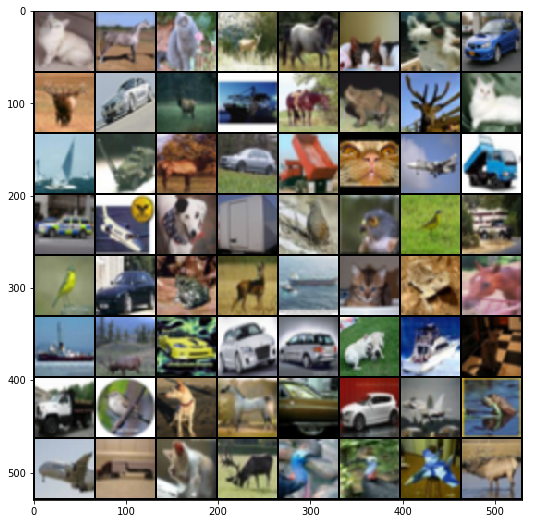

In [29]:
show_img('samples/real_samples.png')

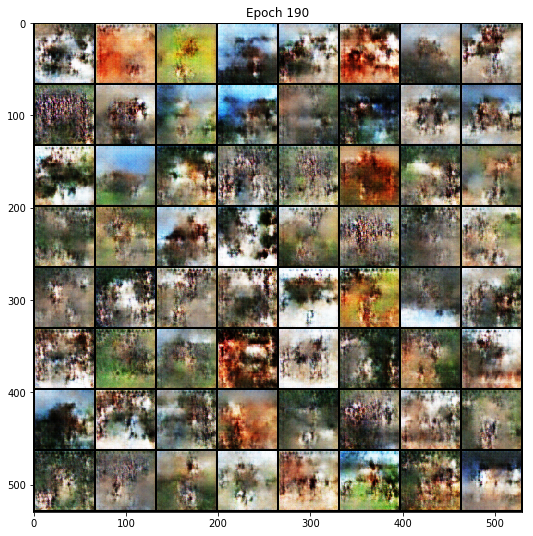

In [57]:
show_img('samples/fake_epoch_190.png')

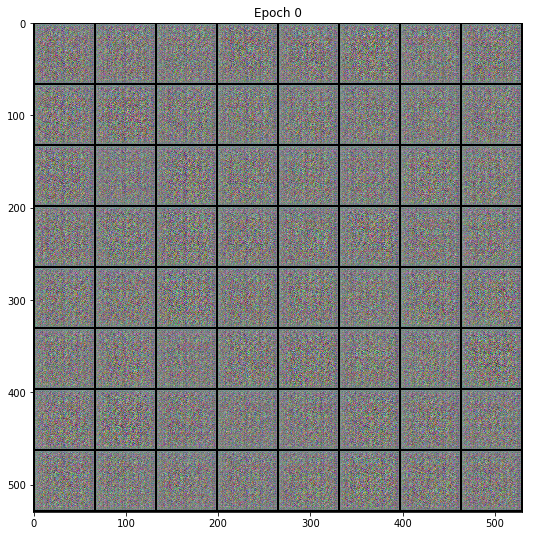

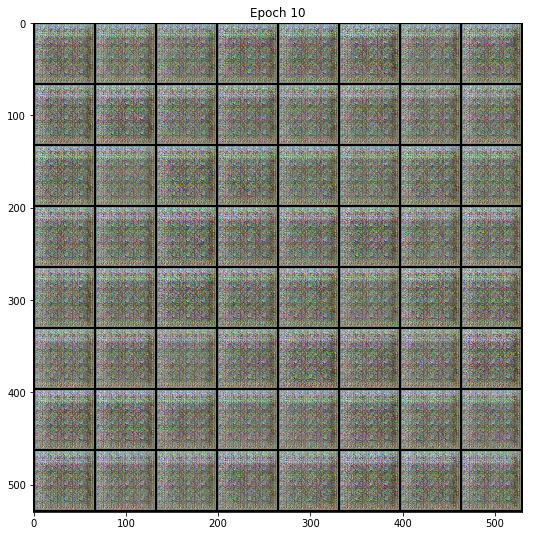

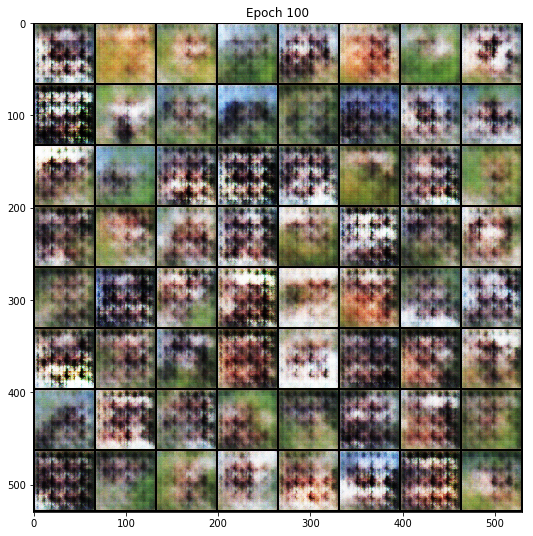

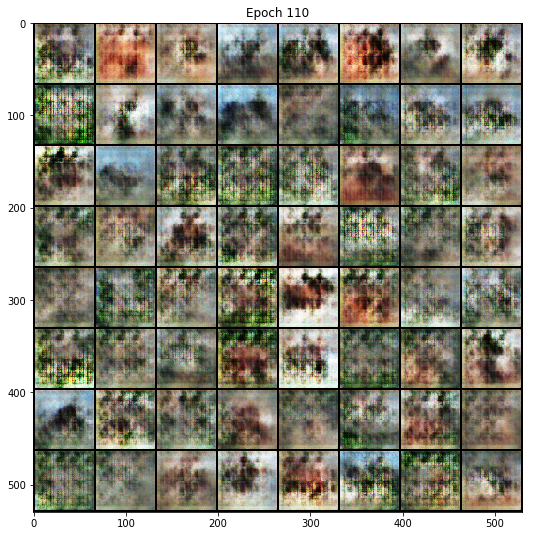

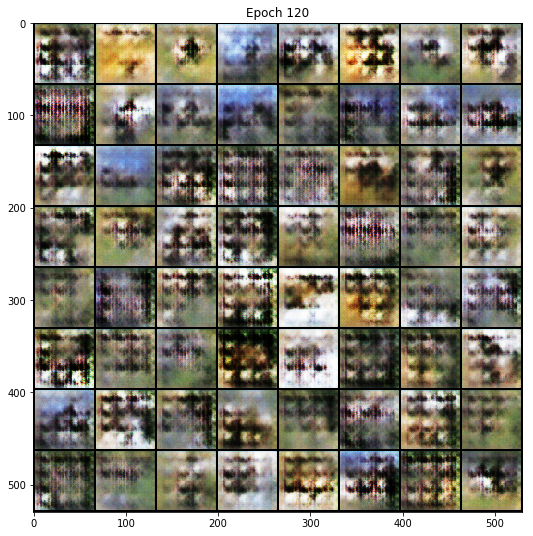

...

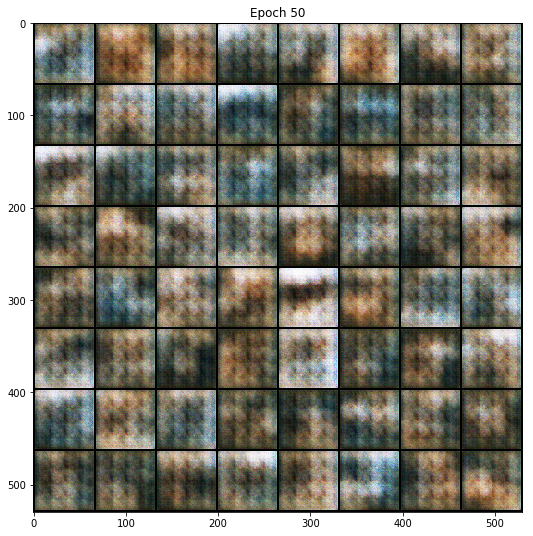

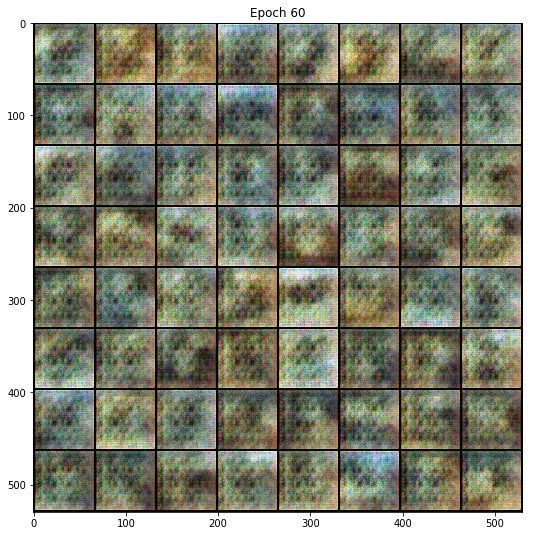

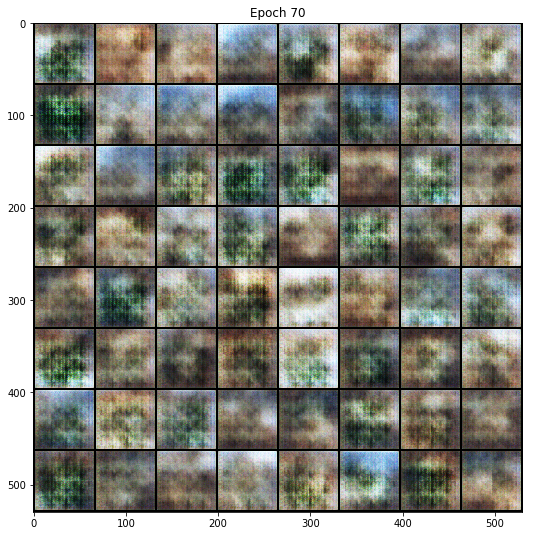

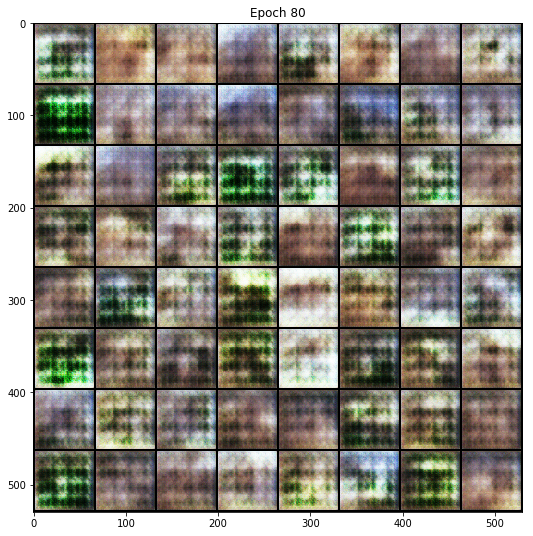

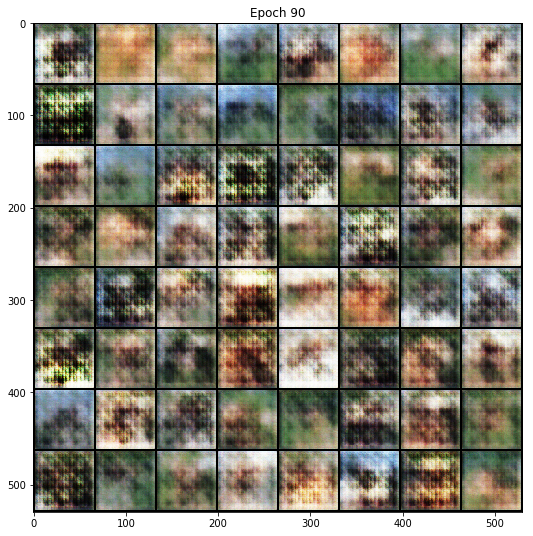

In [58]:
show_samples()

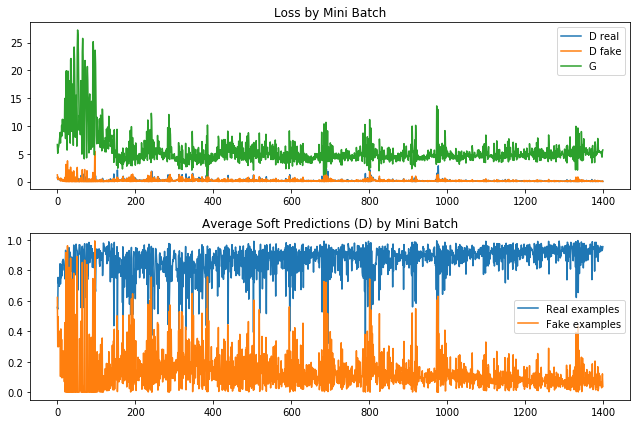

In [59]:
plot_output(output)